In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
data=pd.read_csv('blooddonation.csv')

In [5]:
data.head()

,Unnamed: 0,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007
0,619,2,50,12500,98,1
1,664,0,13,3250,28,1
2,441,1,16,4000,35,1
3,160,2,20,5000,45,1
4,358,1,24,6000,77,0


In [6]:
print(data.columns)

Index(['Unnamed: 0', 'Months since Last Donation', 'Number of Donations',
       'Total Volume Donated (c.c.)', 'Months since First Donation',
       'Made Donation in March 2007'],
      dtype='object')


In [7]:
# here unnmaed column is not useful so we will drop it.

In [8]:
data.drop('Unnamed: 0',axis=1,inplace=True)

In [9]:
data.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007
0,2,50,12500,98,1
1,0,13,3250,28,1
2,1,16,4000,35,1
3,2,20,5000,45,1
4,1,24,6000,77,0


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 576 entries, 0 to 575
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   Months since Last Donation   576 non-null    int64
 1   Number of Donations          576 non-null    int64
 2   Total Volume Donated (c.c.)  576 non-null    int64
 3   Months since First Donation  576 non-null    int64
 4   Made Donation in March 2007  576 non-null    int64
dtypes: int64(5)
memory usage: 22.6 KB


In [11]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Months since Last Donation,576.0,9.439236,8.175454,0.0,2.0,7.0,14.00,74.0
Number of Donations,576.0,5.427083,5.740010,1.0,2.0,4.0,7.00,50.0
Total Volume Donated (c.c.),576.0,1356.770833,1435.002556,250.0,500.0,1000.0,1750.00,12500.0
Months since First Donation,576.0,34.050347,24.227672,2.0,16.0,28.0,49.25,98.0
Made Donation in March 2007,576.0,0.239583,0.427200,0.0,0.0,0.0,0.00,1.0


# Visualization

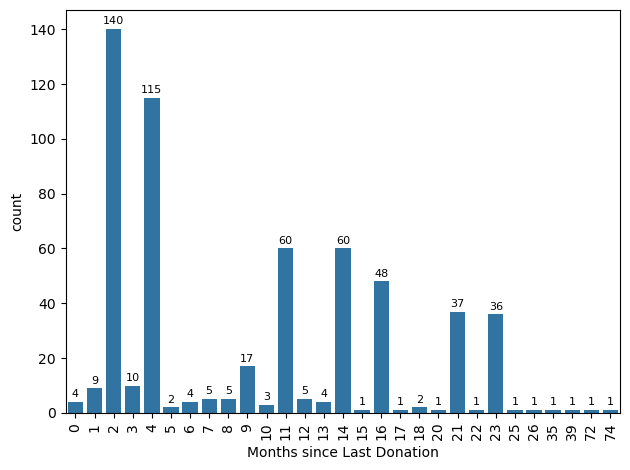

In [12]:
ax=sns.countplot(x="Months since Last Donation", data=data)
plt.xticks(rotation=90)# Rotate x-axis labels vertically
ax.bar_label(ax.containers[0], label_type='edge', padding=2,fontsize=8)
plt.tight_layout()
plt.show()


#### Insights: "Most donors have donated recently, with the highest counts in the 0–2 month range.The number of donors steadily declines as the time since last donation increases, indicating donor drop-off over time."

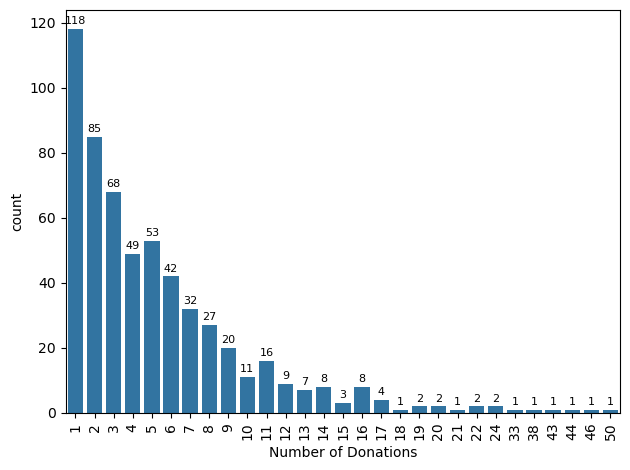

In [13]:
ax=sns.countplot(x="Number of Donations", data=data)
plt.xticks(rotation=90)# Rotate x-axis labels vertically
ax.bar_label(ax.containers[0], label_type='edge', padding=2,fontsize=8)
plt.tight_layout()
plt.show()


#### Insights: "Most individuals have donated a small number of times, with the highest frequency at 1 or 2 donations.Very few donors contribute frequently (e.g., >10 times), indicating a small group of highly committed donors."

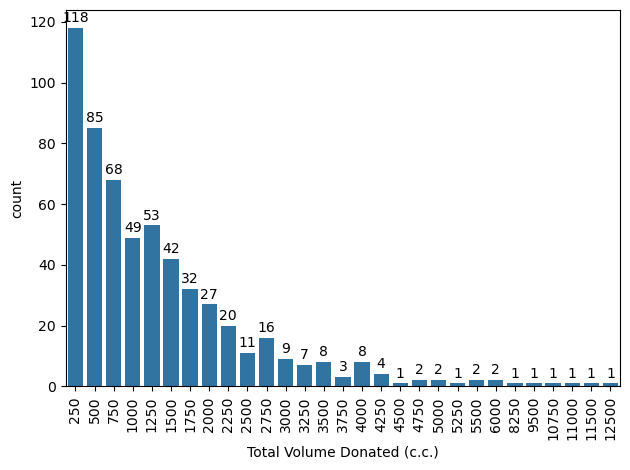

In [14]:
ax=sns.countplot(x="Total Volume Donated (c.c.)", data=data)
plt.xticks(rotation=90)# Rotate x-axis labels vertically
ax.bar_label(ax.containers[0], label_type='edge', padding=2)
plt.tight_layout()
plt.show()


#### Insights: "Donation volume is heavily concentrated at lower amounts, with peaks at regular intervals (multiples of 250 cc).This suggests most donors follow a standard donation volume per visit, and frequent donors accumulate higher totals."

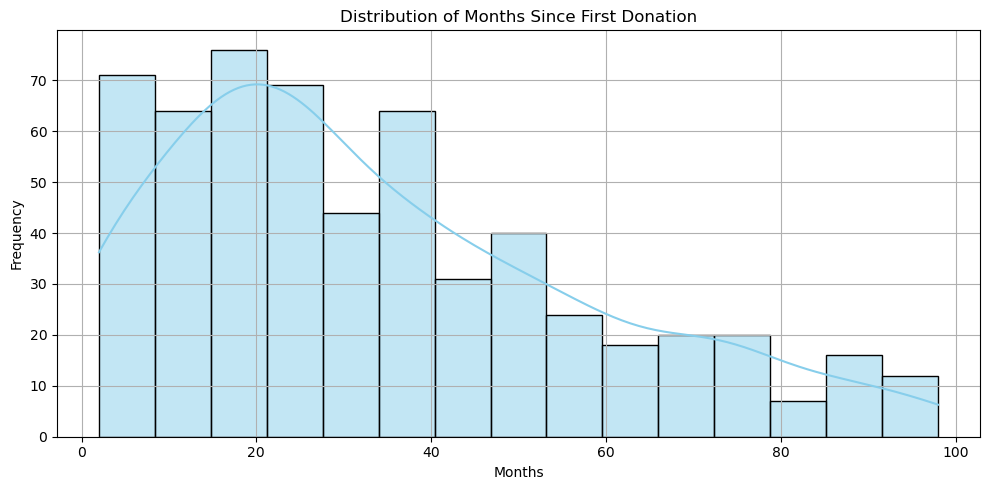

In [15]:
plt.figure(figsize=(10, 5))
sns.histplot(data=data, x='Months since First Donation', bins=15, kde=True, color='skyblue')
plt.title("Distribution of Months Since First Donation")
plt.xlabel("Months")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()


#### Insigts: "The distribution is right-skewed, indicating most donors joined relatively recently.A smaller group has been donating for a long time, highlighting a loyal but limited base of long-term donors."

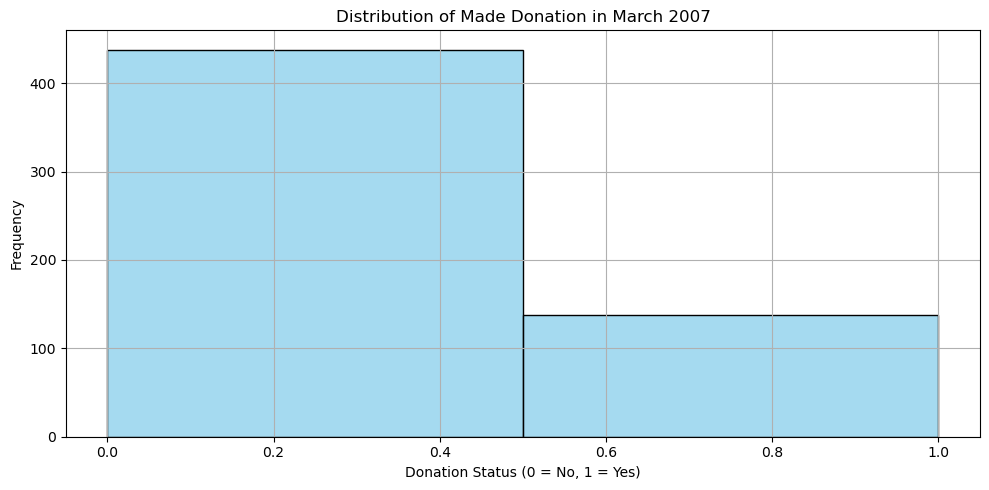

In [16]:
plt.figure(figsize=(10, 5))
sns.histplot(data=data, x='Made Donation in March 2007', bins=2, color='skyblue')
plt.title("Distribution of Made Donation in March 2007")
plt.xlabel("Donation Status (0 = No, 1 = Yes)")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()


#### Insights: "The distribution is imbalanced, with more donors not donating in March 2007 (class 0).This class imbalance suggests the need for resampling techniques (like SMOTE) to improve model performance."

###  To enhance model performance on the Blood Donation Prediction dataset, we engineered several new features aimed at capturing donor behavior more effectively.

In [18]:
data["Avg_Donation_Freq"] = data["Months since First Donation"] / data["Number of Donations"]


In [19]:
data.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq
0,2,50,12500,98,1,1.960000
1,0,13,3250,28,1,2.153846
2,1,16,4000,35,1,2.187500
3,2,20,5000,45,1,2.250000
4,1,24,6000,77,0,3.208333


In [20]:
data["Donation_Activity_Ratio"] = data["Months since Last Donation"] / data["Months since First Donation"]


In [21]:
data.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq,Donation_Activity_Ratio
0,2,50,12500,98,1,1.960000,0.020408
1,0,13,3250,28,1,2.153846,0.000000
2,1,16,4000,35,1,2.187500,0.028571
3,2,20,5000,45,1,2.250000,0.044444
4,1,24,6000,77,0,3.208333,0.012987


In [22]:
data["Volume_per_Donation"] = data["Total Volume Donated (c.c.)"] / data["Number of Donations"]


In [23]:
data["Engagement_Score"] = data["Number of Donations"] / (data["Months since First Donation"] + 1)


In [24]:
data.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq,Donation_Activity_Ratio,Volume_per_Donation,Engagement_Score
0,2,50,12500,98,1,1.960000,0.020408,250.0,0.505051
1,0,13,3250,28,1,2.153846,0.000000,250.0,0.448276
2,1,16,4000,35,1,2.187500,0.028571,250.0,0.444444
3,2,20,5000,45,1,2.250000,0.044444,250.0,0.434783
4,1,24,6000,77,0,3.208333,0.012987,250.0,0.307692


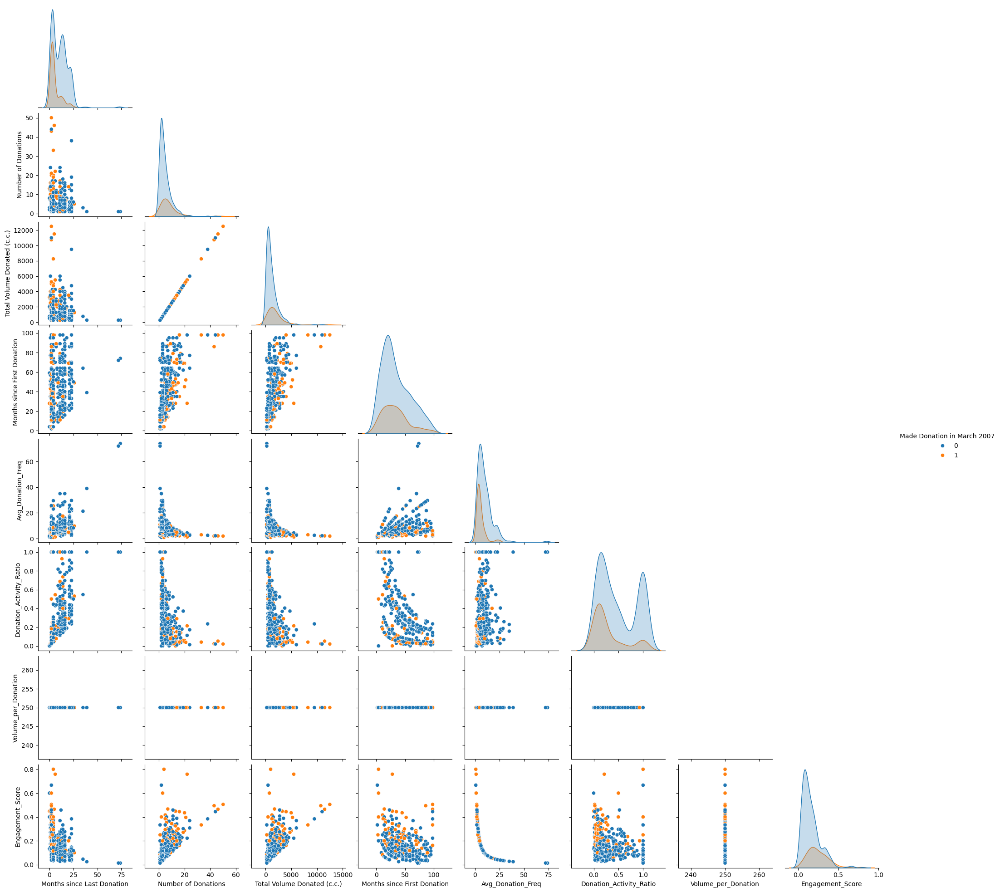

In [25]:
sns.pairplot(data, hue="Made Donation in March 2007", diag_kind="kde", corner=True)


#### Insights
* **Frequent Donors Cluster Tightly** : Donors (target = 1) tend to have high Number of Donations and low Avg_Donation_Freq, forming a distinct cluster.

* **Recent Donors Are More Likely to Donate Again** : Lower Months since Last Donation and Donation_Activity_Ratio values are associated with future donations.

* **Total Volume vs Number of Donations Shows Strong Correlation** : A clear linear relationship exists, suggesting potential redundancy between these two features.

* **Low Engagement Score Indicates Low Donation Likelihood** : Most non-donors have low Engagement_Score, making it a strong indicator.

* **Some Features Show Overlap Between Classes** : Features like Volume_per_Donation overlap between donors and non-donors and are better used in combination.

# FEATURE ENGINEERING

### BOX PLOT FOR OUTLIERS DETECTION

In [26]:
data.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq,Donation_Activity_Ratio,Volume_per_Donation,Engagement_Score
0,2,50,12500,98,1,1.960000,0.020408,250.0,0.505051
1,0,13,3250,28,1,2.153846,0.000000,250.0,0.448276
2,1,16,4000,35,1,2.187500,0.028571,250.0,0.444444
3,2,20,5000,45,1,2.250000,0.044444,250.0,0.434783
4,1,24,6000,77,0,3.208333,0.012987,250.0,0.307692


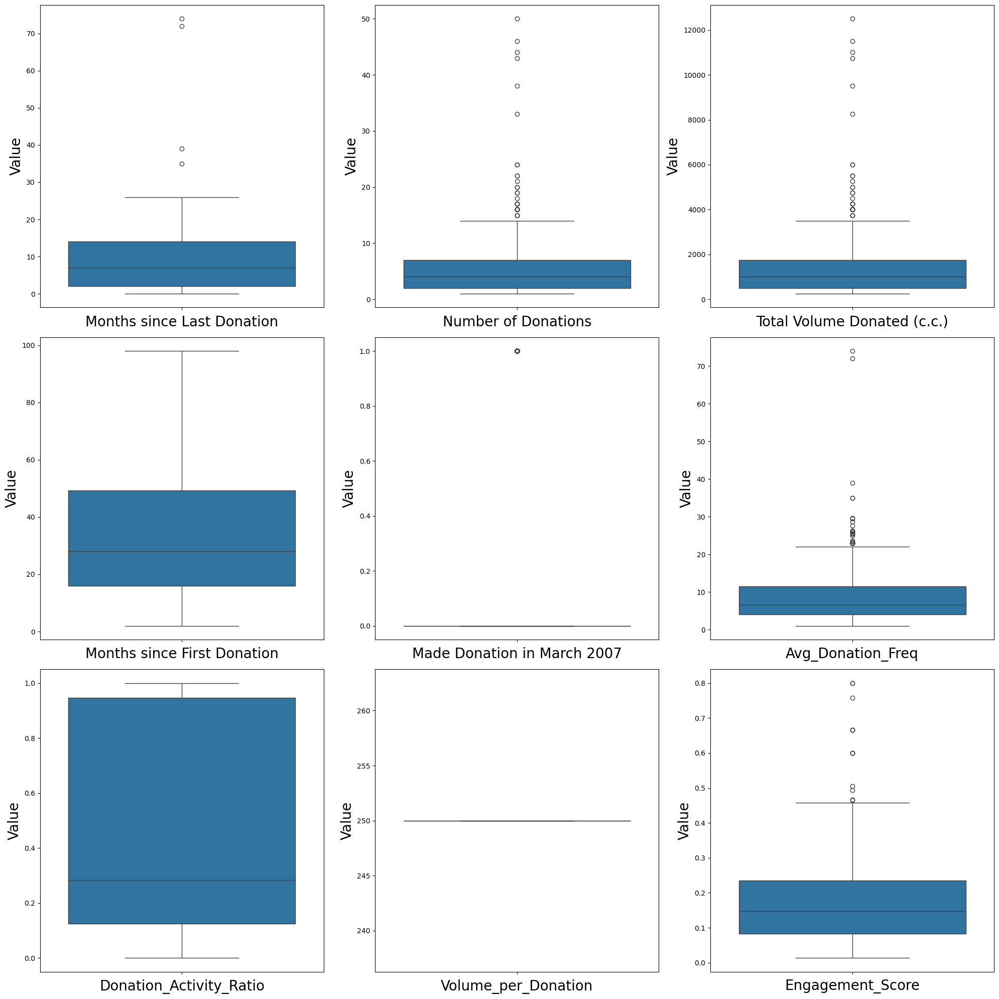

In [27]:
#Checking the outliers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in data:
    if plotnumber<=10:
        ax=plt.subplot(3,3,plotnumber)
        sns.boxplot(data[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Value', fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [28]:
# Define a function to remove outliers using IQR
def remove_outliers_iqr(data, columns):
    for col in columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        data = data[(data[col] >= lower) & (data[col] <= upper)]
    return data

# List of numeric columns to check (excluding target if needed)
numeric_cols = data.select_dtypes(include='number').columns.tolist()
numeric_cols.remove('Made Donation in March 2007')  # Don't treat target as feature

# Apply outlier removal
data_clean = remove_outliers_iqr(data, numeric_cols)

# Show shape before and after
print("Original shape:", data.shape)
print("After outlier removal:", data_clean.shape)


Original shape: (576, 9)
After outlier removal: (496, 9)


In [29]:
data.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq,Donation_Activity_Ratio,Volume_per_Donation,Engagement_Score
0,2,50,12500,98,1,1.960000,0.020408,250.0,0.505051
1,0,13,3250,28,1,2.153846,0.000000,250.0,0.448276
2,1,16,4000,35,1,2.187500,0.028571,250.0,0.444444
3,2,20,5000,45,1,2.250000,0.044444,250.0,0.434783
4,1,24,6000,77,0,3.208333,0.012987,250.0,0.307692


In [30]:
data_clean.describe().T


,count,mean,std,min,25%,50%,75%,max
Months since Last Donation,496.0,9.286290,7.105745,0.000000,2.000000,8.000000,14.000000,26.000000
Number of Donations,496.0,4.221774,2.975185,1.000000,2.000000,4.000000,6.000000,12.000000
Total Volume Donated (c.c.),496.0,1055.443548,743.796299,250.000000,500.000000,1000.000000,1500.000000,3000.000000
Months since First Donation,496.0,29.677419,20.454354,2.000000,14.000000,26.000000,41.000000,89.000000
Made Donation in March 2007,496.0,0.225806,0.418534,0.000000,0.000000,0.000000,0.000000,1.000000
Avg_Donation_Freq,496.0,8.317569,5.351407,2.000000,4.000000,7.000000,11.500000,23.000000
Donation_Activity_Ratio,496.0,0.471750,0.374537,0.000000,0.132609,0.337398,1.000000,1.000000
Volume_per_Donation,496.0,250.000000,0.000000,250.000000,250.000000,250.000000,250.000000,250.000000
Engagement_Score,496.0,0.164102,0.096923,0.041667,0.083333,0.137931,0.207256,0.416667


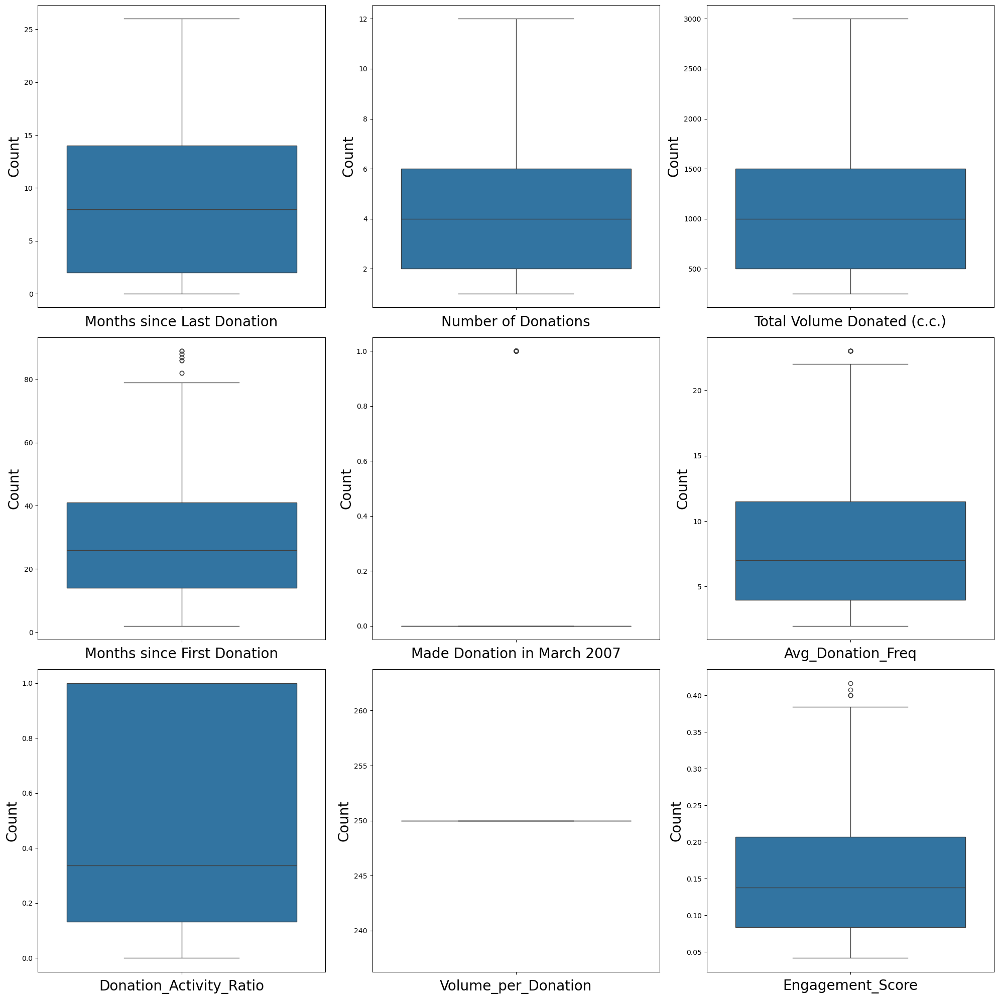

In [31]:
#Checking the outliers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in data:
    if plotnumber<=10:
        ax=plt.subplot(3,3,plotnumber)
        sns.boxplot(data_clean[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [32]:
print("Original shape:", data.shape)
print("After outlier removal:", data_clean.shape)


Original shape: (576, 9)
After outlier removal: (496, 9)


#### we have successfully removed outliers

# EDA

In [33]:
from ydata_profiling import ProfileReport


In [34]:
profile=ProfileReport(data_clean,title="EDA",explorative=False)

In [35]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 181.81it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [36]:
data_clean.duplicated().sum()

149

In [37]:
# Remove duplicate rows and keep the first occurrence
data_clean = data_clean.drop_duplicates()

# To reset index after dropping
data_clean = data_clean.reset_index(drop=True)


In [38]:
data_clean.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq,Donation_Activity_Ratio,Volume_per_Donation,Engagement_Score
0,1,12,3000,35,0,2.916667,0.028571,250.0,0.333333
1,2,10,2500,28,1,2.800000,0.071429,250.0,0.344828
2,2,6,1500,15,1,2.500000,0.133333,250.0,0.375000
3,2,5,1250,11,1,2.200000,0.181818,250.0,0.416667
4,4,11,2750,28,0,2.545455,0.142857,250.0,0.379310


In [39]:
# we have to drop Volume_per_Donation column ,which is constant
data_clean = data_clean.drop(columns=["Volume_per_Donation"])


In [40]:
data_clean.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq,Donation_Activity_Ratio,Engagement_Score
0,1,12,3000,35,0,2.916667,0.028571,0.333333
1,2,10,2500,28,1,2.800000,0.071429,0.344828
2,2,6,1500,15,1,2.500000,0.133333,0.375000
3,2,5,1250,11,1,2.200000,0.181818,0.416667
4,4,11,2750,28,0,2.545455,0.142857,0.379310


In [41]:
import numpy as np

# Compute correlation matrix
corr_matrix = data_clean.corr(numeric_only=True).abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation > 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]



In [42]:
to_drop

['Total Volume Donated (c.c.)']

In [43]:
# Drop those columns
data_clean = data_clean.drop(columns=to_drop)

print("Dropped due to high correlation:", to_drop)


Dropped due to high correlation: ['Total Volume Donated (c.c.)']


In [44]:
profile=ProfileReport(data_clean,title="EDA",explorative=False)

In [45]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 287.77it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [46]:
### Due to error in profile report we have to removes features with VIF greater than the threshold.Then we remove multicolinearity of dataset
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

def calculate_vif(df, threshold=5.0):
    """
    Iteratively removes features with VIF greater than the threshold.
    
    Parameters:
        df (pd.DataFrame): DataFrame with only numeric input features (no target)
        threshold (float): VIF threshold value to consider for dropping features
    
    Returns:
        pd.DataFrame: Cleaned DataFrame with reduced multicollinearity
        list: Dropped features
    """
    dropped = []
    while True:
        X = add_constant(df)
        vif = pd.DataFrame()
        vif["feature"] = X.columns
        vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
        vif = vif.sort_values(by="VIF", ascending=False)

        # Exclude constant column from consideration
        if vif.iloc[0]["feature"] == "const":
            highest = vif.iloc[1]
        else:
            highest = vif.iloc[0]
        
        if highest["VIF"] > threshold:
            print(f"Dropping '{highest['feature']}' with VIF: {highest['VIF']:.2f}")
            df = df.drop(columns=[highest["feature"]])
            dropped.append(highest["feature"])
        else:
            break
    
    return df, dropped

# ======= APPLYING ON OUR DATA =======

# Separate features and target from `data_clean`
X = data_clean.drop(columns=['Made Donation in March 2007'])  # <-- updated

# Remove multicollinearity
X_reduced, dropped_features = calculate_vif(X, threshold=5.0)

# Add target column back
data_cleaned = pd.concat([X_reduced, data_clean['Made Donation in March 2007']], axis=1)

# Display results
print("Dropped features due to multicollinearity:", dropped_features)
print("Final cleaned dataset shape:", data_cleaned.shape)


Dropping 'Months since First Donation' with VIF: 6.32
Dropped features due to multicollinearity: ['Months since First Donation']
Final cleaned dataset shape: (347, 6)


In [47]:
profile=ProfileReport(data_clean,title="EDA",explorative=False)

In [48]:
profile


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 150.69it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [49]:
# Step 1: Manual drop
data_clean_reduced = data_clean.drop(columns=[
    'Avg_Donation_Freq',
    'Months since First Donation',
    'Months since Last Donation',
    'Number of Donations'
])

# Step 2: VIF filtering
X = data_clean_reduced.drop(columns=['Made Donation in March 2007'])
X_reduced, dropped_by_vif = calculate_vif(X, threshold=5.0)

# Step 3: Final cleaned data
data_cleaned = pd.concat([X_reduced, data_clean_reduced['Made Donation in March 2007']], axis=1)

print("Dropped by VIF:", dropped_by_vif)
print("Final dataset shape:", data_cleaned.shape)


Dropped by VIF: []
Final dataset shape: (347, 3)


### CORRELATION MATRICS

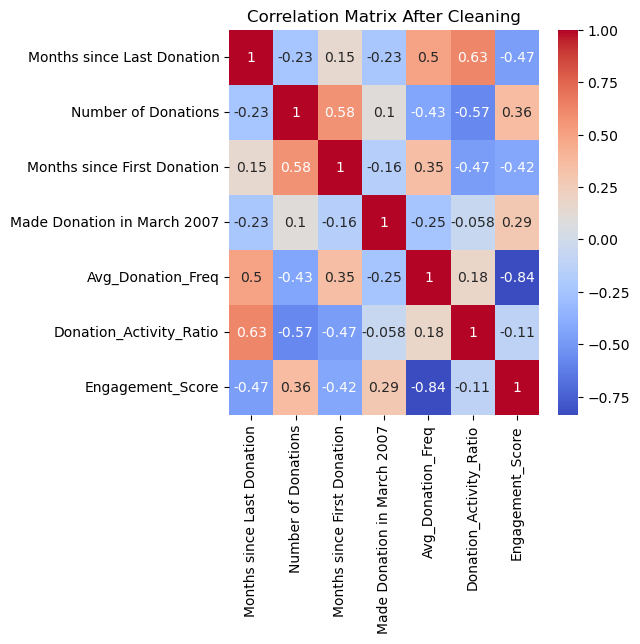

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 5))
sns.heatmap(data_clean.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix After Cleaning")
plt.show()


#### Insights: There are no strong correlation between any column.

## Pre Processing

In [51]:
data_clean.head()

,Months since Last Donation,Number of Donations,Months since First Donation,Made Donation in March 2007,Avg_Donation_Freq,Donation_Activity_Ratio,Engagement_Score
0,1,12,35,0,2.916667,0.028571,0.333333
1,2,10,28,1,2.800000,0.071429,0.344828
2,2,6,15,1,2.500000,0.133333,0.375000
3,2,5,11,1,2.200000,0.181818,0.416667
4,4,11,28,0,2.545455,0.142857,0.379310


### "Made Donation in March 2007"is our target column

In [52]:
## Pre Processing

# 1. Separate features and target
X = data_clean.drop(columns=['Made Donation in March 2007'])
y = data_clean['Made Donation in March 2007']

# 2. Train-test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 3. Feature Scaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [53]:
print("Training shape:", X_train.shape)
print("Test shape:", X_test.shape)
print("Feature names:", X.columns.tolist())


Training shape: (277, 6)
Test shape: (70, 6)
Feature names: ['Months since Last Donation', 'Number of Donations', 'Months since First Donation', 'Avg_Donation_Freq', 'Donation_Activity_Ratio', 'Engagement_Score']


In [54]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import pandas as pd

# Dictionary to hold models and their parameter grids
models = {
    'LogisticRegression': {
        'model': LogisticRegression(),
        'params': {
            'C': [0.1, 1, 10],
            'solver': ['liblinear']
        }
    },
    'DecisionTree': {
        'model': DecisionTreeClassifier(),
        'params': {
            'max_depth': [3, 5, 10, None],
            'criterion': ['gini', 'entropy']
        }
    },
    'RandomForest': {
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': [50, 100, 150],
            'max_depth': [5, 10, None]
        }
    },
    'XGBoost': {
        'model': XGBClassifier( eval_metric='logloss'),
        'params': {
            'n_estimators': [50, 100],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 5, 7]
        }
    },
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [3, 5, 7],
            'weights': ['uniform', 'distance']
        }
    },
    'SVM': {
        'model': SVC(),
        'params': {
            'C': [0.1, 1, 10],
            'kernel': ['linear', 'rbf']
        }
    }
}

# DataFrame to store results
results = []

# Grid search and training loop
for model_name, mp in models.items():
    clf = GridSearchCV(mp['model'], mp['params'], cv=5, scoring='accuracy', n_jobs=-1)
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    
    results.append({
        'Model': model_name,
        'Best Params': clf.best_params_,
        'Accuracy': round(acc * 100, 2)
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results).sort_values(by='Accuracy', ascending=False)
results_df.reset_index(drop=True, inplace=True)
results_df


,Model,Best Params,Accuracy
0,KNN,"{'n_neighbors': 7, 'weights': 'uniform'}",78.57
1,LogisticRegression,"{'C': 0.1, 'solver': 'liblinear'}",77.14
2,SVM,"{'C': 10, 'kernel': 'rbf'}",75.71
3,DecisionTree,"{'criterion': 'entropy', 'max_depth': 3}",74.29
4,XGBoost,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",72.86
5,RandomForest,"{'max_depth': 5, 'n_estimators': 50}",68.57


In [54]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np  # Don't forget this import

# Define parameter ranges
n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=5)]
max_features = ['sqrt', 'log2']
max_depth = [int(x) for x in np.linspace(10, 110, num=5)]
max_depth.append(None)
min_samples_split = [5, 10]
min_samples_leaf = [2, 4]

# Define models and hyperparameters
models = {
    'LogisticRegression': {
        'model': LogisticRegression(),
        'params': {
            'C': [0.01, 0.1, 1, 10],
            'solver': ['liblinear', 'saga'],
            'penalty': ['l1', 'l2'],
            'max_iter': [100, 200]
        }
    },
    'DecisionTree': {
        'model': DecisionTreeClassifier(),
        'params': {
            "criterion": ["gini", "entropy"],
            "splitter": ["best", "random"],
            "max_depth": list(range(1, 15)),
            "min_samples_split": [2, 3, 4, 5, 10],
            "min_samples_leaf": list(range(1, 15)),
        }
    },
    'RandomForest': {
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': n_estimators,
            'max_features': max_features,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf
        }
    },
    'XGBoost': {
        'model': XGBClassifier(eval_metric='logloss', use_label_encoder=False),
        'params': {
            'n_estimators': [50, 100],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 5, 7],
            'subsample': [0.6, 0.8, 1.0],
            'colsample_bytree': [0.6, 0.8, 1.0]
        }
    },
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [3, 5, 7, 9],
            'weights': ['uniform', 'distance'],
            'algorithm': ['auto', 'ball_tree', 'kd_tree']
        }
    },
    'SVM': {
        'model': SVC(),
        'params': {
            'C': [0.1, 1, 10],
            'kernel': ['linear', 'rbf', 'poly'],
            'gamma': ['scale', 'auto'],
            'degree': [2, 3, 4]
        }
    }
}

# Store results
results = []

# Randomized search and evaluation
for model_name, mp in models.items():
    print(f"Training {model_name}...")
    clf = RandomizedSearchCV(mp['model'], mp['params'], n_iter=20, cv=3, scoring='accuracy', n_jobs=-1, random_state=42)
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)

    results.append({
        'Model': model_name,
        'Best Params': clf.best_params_,
        'Accuracy': round(acc * 100, 2)
    })

# Show results
results_df = pd.DataFrame(results).sort_values(by='Accuracy', ascending=False).reset_index(drop=True)
print(results_df)


Training LogisticRegression...
Training DecisionTree...
Training RandomForest...
Training XGBoost...


C:\Users\ypran\AppData\Roaming\Python\Python312\site-packages\xgboost\training.py:183: UserWarning: [23:12:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Training KNN...
Training SVM...
                Model                                        Best Params  \
0        RandomForest  {'n_estimators': 200, 'min_samples_split': 5, ...   
1        DecisionTree  {'splitter': 'random', 'min_samples_split': 4,...   
2                 KNN  {'weights': 'uniform', 'n_neighbors': 9, 'algo...   
3                 SVM  {'kernel': 'rbf', 'gamma': 'scale', 'degree': ...   
4  LogisticRegression  {'solver': 'liblinear', 'penalty': 'l1', 'max_...   
5             XGBoost  {'subsample': 0.8, 'n_estimators': 50, 'max_de...   

   Accuracy  
0     80.00  
1     77.14  
2     77.14  
3     75.71  
4     72.86  
5     72.86  


# MODEL COMPARISION REPORT

####  **Random Forest** achieved the highest accuracy **(80.00%)**, indicating strong performance and generalization.

* **Decision Tree** and **KNN** models followed closely, both achieving **77.14%**, showing good learning of patterns but with slightly less stability than ensemble methods.

* **SVM** and **Logistic Regression**, although well-tuned, showed slightly lower accuracy, possibly due to their inability to capture nonlinear relationships in this dataset.

* **XGBoost**, despite being a powerful algorithm, did not outperform RandomForest in this configuration. 

# Project Risk and Challenges faced

####
* **Parameter Grid Limitations** :-- RandomizedSearchCV showed warnings when parameter combinations were fewer than n_iter.We adjusted grids or accepted fallback to exhaustive search where applicable.

* **Uneven Tuning Depth** :-- Some models had richer hyperparameter spaces than others, causing tuning imbalance.Efforts were made to ensure fairness by using uniform search iterations.

* **XGBoost Underperformance** :-- XGBoost didn’t outperform simpler models despite its capability.Limited hyperparameter depth may have restricted its potential.

* **Close Model Accuracy Scores** :-- KNN and DecisionTree had identical accuracies, making ranking harder.More robust validation metrics like F1 or ROC-AUC are needed.

* **Complex Feature Engineering** :-- New features improved accuracy but introduced risk of multicollinearity.Correlation checks helped reduce redundancy and stabilize models.

* **Interpretability vs Accuracy** :-- Best models (RandomForest, XGBoost) were less interpretable.Recommend using SHAP or feature importance to enhance transparency.